In [1]:
# Enable autoreload extension to automatically reload modules
%load_ext autoreload
%autoreload 1

# Import necessary modules and libraries
from AirSeaFluxCode import AirSeaFluxCode  # Import AirSeaFluxCode class from AirSeaFluxCode module
import xarray as xr  # Import xarray library with alias xr
import gsw_xarray as gsw  # Import gsw_xarray module with alias gsw
import matplotlib.dates as mdates  # Import module for working with dates in matplotlib
import matplotlib.pyplot as plt  # Import matplotlib.pyplot for plotting
import numpy as np  # Import numpy library with alias np for numerical operations
import cartopy.crs as ccrs  # Import cartopy for geospatial data visualization
import cmocean.cm as cmo  # Import colormaps from cmocean for oceanography
from matplotlib.lines import Line2D
import statsmodels.api as sm
from matplotlib.ticker import FuncFormatter
from collections import defaultdict
from tqdm.notebook import tqdm_notebook as tqdm
import scipy.stats as sstats


# Import my_funcs module for interactive reloading
%aimport my_funcs

# Call update_params function from my_funcs module to update parameters
my_funcs.update_params(fontsize=24)

# Define a function to customize x-axis ticks on a plot
def fix_xticks(ax):
    ax.xaxis.set_major_locator(mdates.MonthLocator())  # Set major ticks to display month
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%b"))  # Format major ticks as abbreviated month (e.g., Jan)
    # Set x-axis label to '2019'
    ax.set_xlabel('2019')

# Define color variables with hexadecimal color codes
c20 = "#C13F89"  # Define color c20
c22 = "#3ec177"  # Define color c22
c23 = "#3e88c1"  # Define color c23
ext = "#a43ec1"  # Define color ext

# Manually create Line2D objects for legend handles
legend_lines = [
    Line2D([], [], color=c20, lw=3, label='SD1020'),
    Line2D([], [], color=c22, lw=3, label='SD1022'),
    Line2D([], [], color=c23, lw=3, label='SD1023')]

# Manually create Line2D objects for legend handles
legend_dots = [
    Line2D([], [], color=c20, lw=0, marker='.', ms=25, label='SD1020'),
    Line2D([], [], color=c22, lw=0, marker='.', ms=25, label='SD1022'),
    Line2D([], [], color=c23, lw=0, marker='.', ms=25, label='SD1023')]

# Define a custom formatter function
def km_formatter(x, pos):
    return f'{x / 1:.0f} km'

colors = [c20, c22, c23]
labels = ["SD1020", "SD1022", "SD1023"]


In [18]:
ds20 = xr.open_dataset("../data/sd1020_5min_1km.nc")
ds22 = xr.open_dataset("../data/sd1022_5min_1km.nc")
ds23 = xr.open_dataset("../data/sd1023_5min_1km.nc")

In [2]:
ds20 = xr.open_dataset("../data/sd1020_5min.nc")
ds22 = xr.open_dataset("../data/sd1022_5min.nc").isel(time=slice(0,19126))
ds23 = xr.open_dataset("../data/sd1023_5min.nc").isel(time=slice(0,19126))

In [3]:
dst20 = ds20.swap_dims({"time":"distance"}).interp(distance=np.arange(0,ds20['distance'].max().values+1,1000))
dst22 = ds22.swap_dims({"time":"distance"}).interp(distance=np.arange(0,ds22['distance'].max().values+1,1000))
dst23 = ds23.swap_dims({"time":"distance"}).interp(distance=np.arange(0,ds23['distance'].max().values+1,1000))

In [217]:
def calc_stats(dists, means, stds):

    # Create a defaultdict to store indices for each unique value
    indices_map = defaultdict(list)

    # Iterate over the indices and corresponding values in the dists list
    for index, value in enumerate(dists):
        indices_map[value].append(index)

    # Create dictionaries to store the statistical values for each unique value
    means_map = {}
    std_map = {}
    p95_map = {}
    p05_map = {}
    median_map = {}
    mode_map = {}

    # Iterate over the unique values and their corresponding indices
    for unique_value, indices in indices_map.items():
        # Calculate statistical values for the corresponding indices in the means list
        mean_value = np.mean([means[i] for i in indices])
        std_value = np.mean([stds[i] for i in indices])
        p95_value = np.nanpercentile([means[i] for i in indices], 95)
        p05_value = np.nanpercentile([means[i] for i in indices], 5)
        median_value = np.median([means[i] for i in indices])
        mode_value = sstats.mode([np.round(means[i],1) for i in indices])[0][0]

        # Store the statistical values in the respective dictionaries
        means_map[unique_value] = mean_value
        std_map[unique_value] = std_value
        p95_map[unique_value] = p95_value
        p05_map[unique_value] = p05_value
        median_map[unique_value] = median_value
        mode_map[unique_value] = mode_value

    # Create numpy arrays from the dictionaries
    dist = np.array(list(p95_map.keys()))
    std = np.array(list(std_map.values()))
    p95 = np.array(list(p95_map.values()))
    p05 = np.array(list(p05_map.values()))
    median = np.array(list(median_map.values()))
    mean = np.array(list(means_map.values()))
    mode = np.array(list(mode_map.values()))

    # Create an xarray dataset
    ds = xr.Dataset({
        'std': (('dist',), std),
        'p95': (('dist',), p95),
        'p05': (('dist',), p05),
        'delta': (('dist',), p95-p05),
        'median': (('dist',), median),
        'mean': (('dist',), mean),
        'mode': (('dist',), mode),
    }, coords={'dist': dist})

    return ds


In [ ]:
stats20 = calc_stats(dists20,means20)
stats22 = calc_stats(dists22,means22)
stats23 = calc_stats(dists23,means23)

NameError: name 'dists20' is not defined

In [150]:
reg20 = linregress(stats20['dist'], stats20['delta'])
reg22 = linregress(stats22['dist'], stats22['delta'])
reg23 = linregress(stats23['dist'], stats23['delta'])

In [167]:
print(reg20.rvalue**2)
print(reg22.rvalue**2)
print(reg23.rvalue**2)

0.8344509156275193
0.8421579104621968
0.8243632703668068


[Text(0, 0.5, '$\\Delta$ 95$^{th}$ - 5$^{th}$ percentile (W m$^{-2}$)'),
 Text(0.5, 0, 'Sampling scale (km)')]

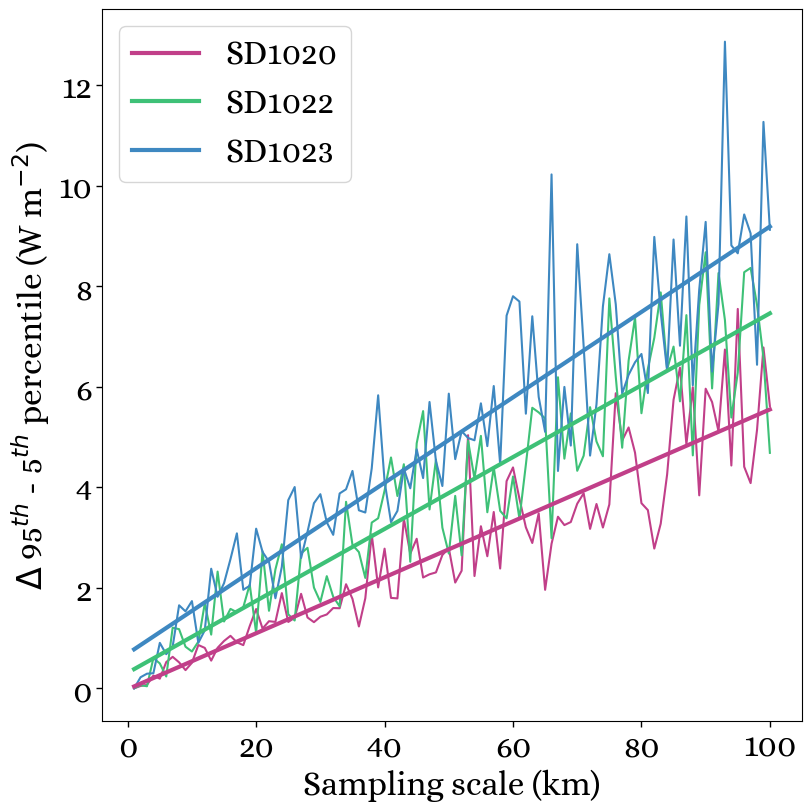

In [164]:
fig,ax = plt.subplots(figsize=(8,8),constrained_layout=True)

stats20['delta'].plot(ax=ax,c=c20)
stats22['delta'].plot(ax=ax,c=c22)
stats23['delta'].plot(ax=ax,c=c23)

ax.plot(stats20['dist'], reg20.slope * stats20['dist'] + reg20.intercept, c=c20, lw=3)
ax.plot(stats22['dist'], reg22.slope * stats22['dist'] + reg22.intercept, c=c22, lw=3)
ax.plot(stats23['dist'], reg23.slope * stats23['dist'] + reg23.intercept, c=c23, lw=3)

ax.legend(handles=legend_lines, loc='upper left',ncols=1)
ax.set(ylabel = r"$\Delta$ 95$^{th}$ - 5$^{th}$ percentile (W m$^{-2}$)",
       xlabel = 'Sampling scale (km)')

In [7]:
def plot_cone(dists, means, ax, bins, cmap, cbar=False):
    
    # Create lists to store the x and y coordinates
    x_coords = []
    y_coords = []

    # Create a defaultdict to store indices for each unique value
    indices_map = defaultdict(list)

    # Iterate over the indices and corresponding values in the dists list
    for index, value in enumerate(dists):
        indices_map[value].append(index)

    # Create a dictionary to store the count of available data points for each distance bin
    available_counts = {dist: len(indices) for dist, indices in indices_map.items()}

    # Iterate over the unique values and their corresponding indices
    for dist, indices in indices_map.items():
        # Append the corresponding dist value to the x_coords list for each index in indices
        x_coords.extend([dist] * len(indices))
        # Append the corresponding mean value to the y_coords list for each index in indices
        y_coords.extend([means[i] for i in indices])

    # Create a 2D histogram of the data points
    heatmap, xedges, yedges = np.histogram2d(x_coords, y_coords, bins=bins)

    # Normalize each row of the histogram independently
    row_sums = heatmap.sum(axis=1, keepdims=True)
    normalized_heatmap = heatmap / row_sums * 100

    # Set zero values to NaN to blank those areas on the heatmap
    normalized_heatmap[normalized_heatmap == 0] = np.nan

    # Plot the heatmap
    img = ax.imshow(normalized_heatmap.T, 
                    extent=[xedges[0], 
                            xedges[-1], 
                            yedges[0], 
                            yedges[-1]], 
                    origin='lower', 
                    aspect='auto', 
                    cmap=cmap, 
                    norm=LogNorm(vmin=0.1, vmax=100))
    #if cbar:
    #    plt.colorbar(img, ax=ax, label='Relative Frequency')  # Add a colorbar indicating the relative frequency of points
#    ax.set(xlabel = 'Distance (km)', ylabel='Mean turbulent heat flux (W m$^{-2}$)')
    return img

In [17]:
import matplotlib.patches as patches
from matplotlib.ticker import MaxNLocator
from matplotlib.colors import LogNorm
from matplotlib.patches import ConnectionPatch

## New attempt

Let's calculate the heat fluxes for each ensemble

In [10]:
def calc_tasf(ds,SST):

    air_hum = AirSeaFluxCode(np.asarray(ds["wind_speed"]),            # Wind speed 
                             np.asarray(ds["TEMP_AIR_MEAN"]), 
                             np.asarray(ds[SST]), 
                             "skin", 
                             meth = "C35", 
                             lat = np.asarray(ds["latitude"]),              # Latitude, 
                             hin = [3.68,2.5,2.5], 
                             hout = 10,
                             hum=["rh", np.asarray(ds["RH_MEAN"])], 
                             out_var = ['latent','sensible'])
        
    # Assign some flags or indicators to the 'flags' column
    ds['sensible'] = (list(ds.dims)[0]), air_hum['sensible']
    ds['latent'] = (list(ds.dims)[0]), air_hum['latent']
    ds['tasf'] = (list(ds.dims)[0]), air_hum['latent'] + air_hum['sensible']

    return ds

In [207]:
def calc_subsets(ds, SST):
    """
    Function to calculate subsets and their means from a dataset.

    Parameters:
        - ds (xarray.Dataset): Dataset containing the data.
        - SST (str): Sea surface temperature variable name.

    Returns:
        - ss (list): List of subsets.
        - ssmeans (list): List of means of each subset.
        - dists (list): List of distances for each subset.
    """
    # Initialize lists to store subsets, subset means, and distances
    ss = []         # List to store subsets
    ssmeans = []    # List to store subset means
    ssstds = []    # List to store subset means
    dists = []      # List to store distances

    # Iterate over distance bins
    for i in tqdm(np.arange(1, 101, 1), desc="Running through each distance bin"):
        # Iterate over each subset within the distance bin
        for j in np.arange(0, i, 1):
            # Calculate subset using calc_tasf function
            subset = calc_tasf(ds.isel(distance=np.arange(0+j, int(ds["distance"].max().values/1000), i)), SST)
            # Append subset, subset mean, and distance to respective lists
            ss.append(subset)
            ssmeans.append(float(subset['tasf'].mean('distance').values))
            ssstds.append(float(subset['tasf'].std('distance').values))
            dists.append(i)

    return ss, ssmeans, dists, ssstds

In [13]:
ss20, ssmeans20, dists20, stds20 = calc_subsets(dst20, "TEMP_IR_SEA_WING_UNCOMP_MEAN")
ss22, ssmeans22, dists22, stds22 = calc_subsets(dst22, "TEMP_CTD_RBR_MEAN")
ss23, ssmeans23, dists23, stds23 = calc_subsets(dst23, "TEMP_CTD_RBR_MEAN")

Running through each distance bin:   0%|          | 0/100 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/1 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/2 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/3 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/4 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/5 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/6 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/7 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/8 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/9 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/10 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/11 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/12 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/13 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/14 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/15 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/16 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/17 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/18 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/19 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/20 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/21 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/22 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/23 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/24 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/25 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/26 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/27 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/28 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/29 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/30 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/31 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/32 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/33 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/34 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/35 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/36 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/37 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/38 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/39 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/40 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/41 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/42 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/43 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/44 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/45 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/46 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/47 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/48 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/49 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/50 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/51 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/52 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/53 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/54 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/55 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/56 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/57 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/58 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/59 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/60 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/61 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/62 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/63 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/64 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/65 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/66 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/67 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/68 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/69 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/70 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/71 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/72 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/73 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/74 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/75 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/76 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/77 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/78 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/79 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/80 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/81 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/82 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/83 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/84 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/85 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/86 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/87 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/88 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/89 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/90 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/91 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/92 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/93 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/94 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/95 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/96 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/97 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/98 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/99 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/100 [00:00<?, ?it/s]

Running through each distance bin:   0%|          | 0/100 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/1 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/2 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/3 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/4 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/5 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/6 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/7 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/8 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/9 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/10 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/11 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/12 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/13 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/14 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/15 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/16 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/17 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/18 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/19 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/20 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/21 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/22 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/23 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/24 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/25 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/26 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/27 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/28 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/29 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/30 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/31 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/32 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/33 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/34 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/35 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/36 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/37 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/38 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/39 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/40 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/41 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/42 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/43 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/44 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/45 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/46 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/47 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/48 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/49 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/50 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/51 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/52 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/53 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/54 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/55 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/56 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/57 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/58 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/59 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/60 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/61 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/62 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/63 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/64 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/65 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/66 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/67 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/68 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/69 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/70 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/71 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/72 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/73 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/74 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/75 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/76 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/77 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/78 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/79 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/80 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/81 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/82 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/83 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/84 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/85 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/86 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/87 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/88 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/89 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/90 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/91 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/92 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/93 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/94 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/95 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/96 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/97 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/98 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/99 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/100 [00:00<?, ?it/s]

Running through each distance bin:   0%|          | 0/100 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/1 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/2 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/3 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/4 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/5 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/6 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/7 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/8 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/9 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/10 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/11 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/12 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/13 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/14 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/15 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/16 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/17 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/18 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/19 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/20 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/21 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/22 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/23 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/24 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/25 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/26 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/27 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/28 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/29 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/30 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/31 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/32 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/33 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/34 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/35 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/36 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/37 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/38 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/39 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/40 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/41 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/42 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/43 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/44 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/45 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/46 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/47 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/48 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/49 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/50 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/51 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/52 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/53 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/54 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/55 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/56 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/57 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/58 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/59 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/60 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/61 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/62 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/63 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/64 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/65 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/66 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/67 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/68 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/69 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/70 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/71 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/72 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/73 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/74 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/75 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/76 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/77 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/78 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/79 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/80 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/81 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/82 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/83 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/84 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/85 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/86 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/87 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/88 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/89 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/90 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/91 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/92 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/93 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/94 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/95 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/96 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/97 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/98 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/99 [00:00<?, ?it/s]

Saving each subset:   0%|          | 0/100 [00:00<?, ?it/s]

In [14]:
stats20 = calc_stats(dists20,ssmeans20,stds20)
stats22 = calc_stats(dists22,ssmeans22,stds22)
stats23 = calc_stats(dists23,ssmeans23,stds23)

In [225]:
def add_box(ax,ym,lim,ylim):
    ax.add_patch(patches.Polygon([(0,  ym-ylim),
                                  (0,  ym+ylim),
                                  (lim, ym+ylim), 
                                  (lim, ym-ylim)], closed=True, linewidth=2, edgecolor='grey', facecolor='None'))
    axs.text(lim-lim*0.1,ym+9,l2,c='grey',ha="center")

def fix_spines(ax,c):
    for spine in ax.spines.values():
        spine.set_color(c)
        spine.set_linewidth(3)

In [48]:
def plot_cone_plots(dists,means,stats,ax,bins,cbar):

    img = plot_cone(dists, means, ax, bins,cmap=cmap,cbar=False)
    (stats.isel(dist=slice(0,bins[0][-1]))['p95']-ym).plot(ax=ax,c='w',lw=5,zorder=4)
    (stats.isel(dist=slice(0,bins[0][-1]))['p95']-ym).plot(ax=ax,c='k',lw=3,zorder=4)
    (stats.isel(dist=slice(0,bins[0][-1]))['p05']-ym).plot(ax=ax,c='w',lw=5,zorder=4)
    (stats.isel(dist=slice(0,bins[0][-1]))['p05']-ym).plot(ax=ax,c='k',lw=3,zorder=4)
    (stats.isel(dist=slice(0,bins[0][-1]))['mode']-ym).plot(ax=ax,c='k',ls="",marker=".",mew=2, mec="w",zorder=5,ms=15)
    return img

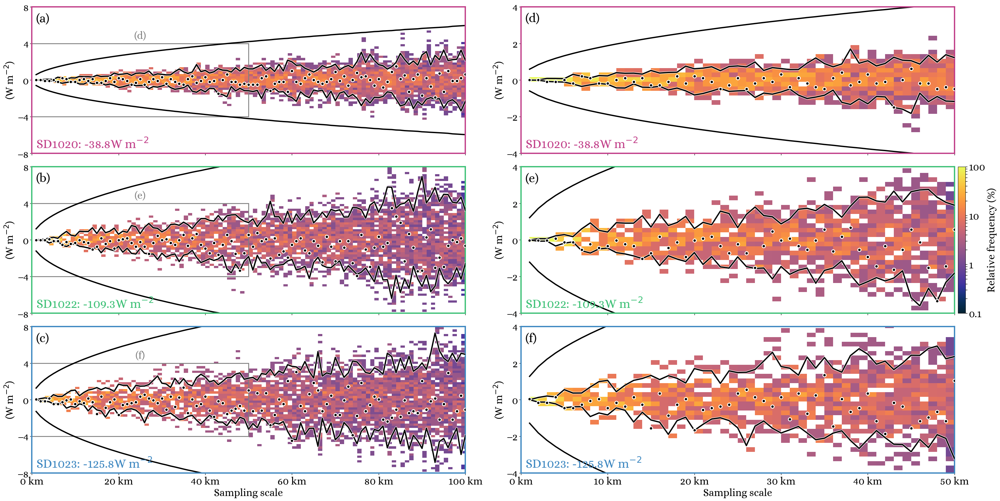

In [189]:
fig,AX = plt.subplots(3,2,figsize=(32,16),constrained_layout=True, sharex="col")

cmap="cmo.thermal"

for ax, lim, ylim, let in zip(AX.T,
                              [100,50],
                              [8,4],
                              [["(a)","(b)","(c)"],["(d)","(e)","(f)"]]):
    
    for axs, dists, ds, means, stats, x, t, c, l,l2 in zip(ax,
                                                     [dists20, dists22, dists23],
                                                     [dst20, dst22, dst23],
                                                     [ssmeans20, ssmeans22, ssmeans23],
                                                     [stats20, stats22, stats23],
                                                     ['','','Sampling scale'],
                                                     ['SD1020','SD1022','SD1023'],
                                                     [c20,c22,c23],
                                                     let, ["(d)","(e)","(f)"]
                                                    ):
        ym = means[0]
       
        img = plot_cone_plots(dists, np.array(means)-ym, stats, axs,[np.arange(1,lim+1,1),np.arange(-10.1,10.1,0.25)],cbar=False)
        #(stats.isel(dist=slice(1,lim+1))['p95']).plot(ax=ax,c='w',lw=5,zorder=4)

        for pm in [1,-1]:
            #axs.plot(np.array([0,100]),pm*np.sqrt(np.array([0,100])),lw=3,c='k')
            axs.plot(np.arange(1,101,1),stats['std'].values/np.sqrt((len(ds.distance)/stats.dist).astype(int).values)*pm,lw=3,c='k')
            axs.axhline(ym+pm,c='k',lw=3,ls='--')

        axs.set(xlabel=x, ylabel="(W m$^{-2}$)",ylim=(-ylim,+ylim),xlim=(0,lim))
        axs.set_title(t + f": {np.round(ym,1)}" + r"W m$^{-2}$",c=c,loc='right',y=0.02,x=0.01,ha='left')
        axs.set_title(l,c='k',loc='left',y=0.88,x=0.01)
    
        fix_spines(axs,c)

        axs.yaxis.set_major_locator(MaxNLocator(integer=True,nbins=5))
        axs.xaxis.set_major_formatter(FuncFormatter(km_formatter))

        if lim == 100:
            add_box(axs,0,lim/2,ylim/2)


cbar=plt.colorbar(img, ax=ax[1], label='Relative frequency (%)', pad=-0.025, aspect=20)
cbar.set_ticks([0.1,1,10,100])
cbar.set_ticklabels(['0.1','1','10','100'])

In [136]:
reg20 = sstats.linregress(stats20['dist'], stats20['delta'])
reg22 = sstats.linregress(stats22['dist'], stats22['delta'])
reg23 = sstats.linregress(stats23['dist'], stats23['delta'])

regs = [reg20,reg22,reg23]

In [64]:
print(reg20.rvalue**2)
print(reg22.rvalue**2)
print(reg23.rvalue**2)

0.8296513141440821
0.8309418784337463
0.8314457120560407


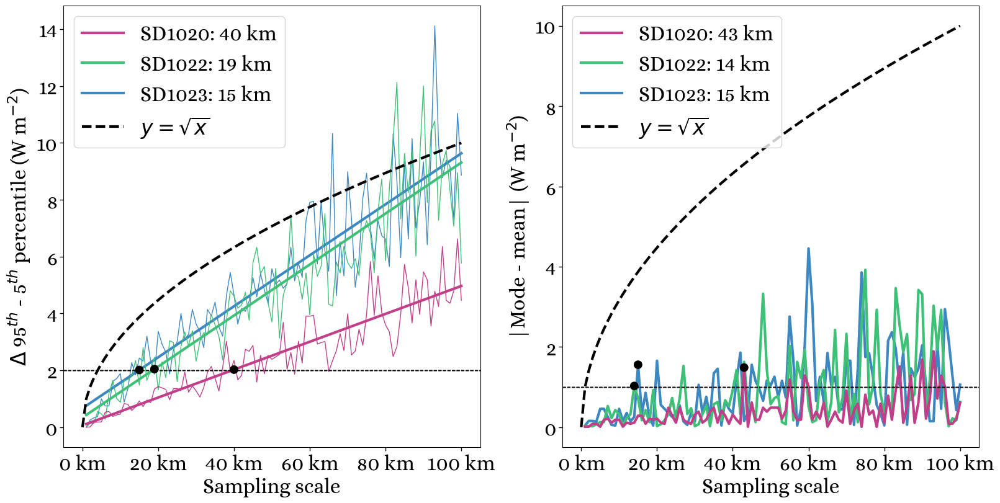

In [124]:
fig, ax = plt.subplots(1,2,figsize=(16,8),constrained_layout=True)

for i,axs in enumerate(ax):
    for stats,c,z,l,regs in zip([stats20,stats22,stats23],colors,[3,2,1],labels,[reg20,reg22,reg23]):
        
        if i == 0:
            idx = int(np.where((regs.slope * stats['dist'] + regs.intercept).values > 2)[0][0])
            axs.scatter(stats['dist'][idx],(regs.slope * stats['dist'] + regs.intercept).values[idx],zorder=z+1,fc="k",ec="None",s=100)
            stats["delta"].plot(c=c,lw=1,zorder=z,ax=axs)
            axs.axhline(2,lw=1,ls='--',c='0',zorder=3)
            axs.set(xlabel="Sampling scale",ylabel=r"$\Delta$ 95$^{th}$ - 5$^{th}$ percentile (W m$^{-2}$)")
            axs.plot(stats['dist'], regs.slope * stats['dist'] + regs.intercept, c=c, lw=3, label=l + f": {stats['dist'][idx].values} km",zorder=z)

        if i == 1:
            idx = int(np.where(np.abs(stats["mode"]-stats["mean"]).values > 1)[0][0])
            axs.scatter(stats['dist'][idx],np.abs(stats["mode"]-stats["mean"])[idx],zorder=z+1,fc="k",ec="None",s=100)
            np.abs(stats["mode"]-stats["mean"]).plot(c=c,lw=3,zorder=z,ax=axs, label=l + f": {stats['dist'][idx].values} km")
            axs.axhline( 1,lw=1,ls='--',c='0',zorder=3)
            axs.set(xlabel="Sampling scale",ylabel=r"|Mode - mean| (W m$^{-2}$)")
    
    axs.plot(np.arange(0,101,1),np.sqrt(np.arange(0,101,1)),lw=3,ls='--',c='k',label=r"$y = \sqrt{x}$")#r"y=\sqrt{x}$")
    axs.legend()
    axs.xaxis.set_major_formatter(FuncFormatter(km_formatter))


plt.show()

In [126]:
datasets = [dst20,dst22,dst23]

In [127]:
dst20['tasf'] = dst20['sensible'] + dst20['latent']
dst22['tasf'] = dst22['sensible'] + dst22['latent']
dst23['tasf'] = dst23['sensible'] + dst23['latent']

In [143]:
dregs = sstats.linregress([reg20.slope,reg22.slope,reg23.slope],
           [dst20['tasf'].std().values,dst22['tasf'].std().values,dst23['tasf'].std().values])

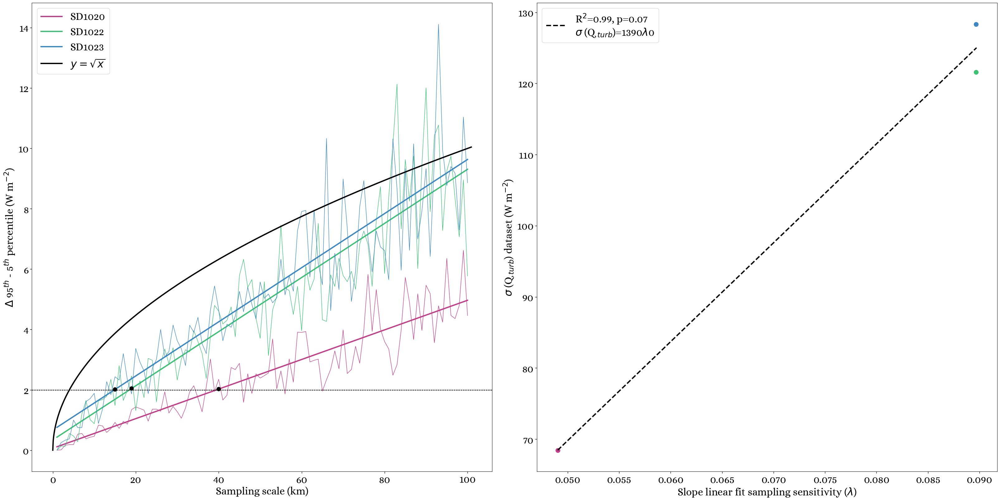

In [156]:
fig,(ax,bx) = plt.subplots(1,2,figsize=(32,16),constrained_layout=True)

for ds,stats,c,reg,l,z in zip(datasets,[stats20, stats22, stats23], colors, regs, labels, [3,2,1]):

    stats['delta'].plot(ax=ax,c=c,lw=1)

    ax.plot(stats['dist'], reg.slope * stats['dist'] + reg.intercept, c=c, lw=3, label=l)
    ax.axhline(2,lw=1,ls='--',c='0',zorder=3)

    ax.set(ylabel = r"$\Delta$ 95$^{th}$ - 5$^{th}$ percentile (W m$^{-2}$)",
           xlabel = 'Sampling scale (km)')
    
    bx.scatter(reg.slope, ds['tasf'].std().values,c=c,s=100)
    idx = int(np.where((reg.slope * stats['dist'] + reg.intercept).values > 2)[0][0])
    ax.scatter(stats['dist'][idx],(reg.slope * stats['dist'] + reg.intercept).values[idx],zorder=z+1,fc="k",ec="None",s=100)

ax.plot(np.arange(0,101,0.1),np.sqrt(np.arange(0,101,0.1)),lw=3,ls='-',c='k',label=r"$y=\sqrt{x}$")

ax.legend(loc='upper left',ncols=1)

bx.plot([reg20.slope,reg22.slope,reg23.slope],
         dregs.slope*np.array([reg20.slope,reg22.slope,reg23.slope]) + dregs.intercept,
         lw=3, c='k',ls='--',label=f"R$^2$={(dregs.rvalue**2).round(2)}, p={dregs.pvalue.round(2)}\n" + 
         r"$\sigma$ (Q $_{turb}$)=" + f"{int(dregs.slope)}" + r"$\lambda$"+f"{int(dregs.intercept)}")


bx.legend()
bx.set(xlabel=r"Slope linear fit sampling sensitivity ($\lambda$)",
       ylabel=r"$\sigma$ (Q $_{turb}$) dataset (W m$^{-2}$)")

plt.show()

## Let's evaluate whether the difference in spread is due to the buggy RH

In [154]:
def calc_subsets_split(ds, SST):
    """
    Function to calculate subsets and their means from a dataset.

    Parameters:
        - ds (xarray.Dataset): Dataset containing the data.
        - SST (str): Sea surface temperature variable name.

    Returns:
        - ss (list): List of subsets.
        - ssmeans (list): List of means of each subset.
        - dists (list): List of distances for each subset.
    """
    # Initialize lists to store subsets, subset means, and distances
    ss = []         # List to store subsets
    sensible_means = []    # List to store subset means
    latent_means   = []    # List to store subset means
    dists = []      # List to store distances

    # Iterate over distance bins
    for i in tqdm(np.arange(1, 101, 1), desc="Running through each distance bin"):
        # Iterate over each subset within the distance bin
        for j in np.arange(0, i, 1):
            # Calculate subset using calc_tasf function
            subset = calc_tasf(ds.isel(distance=np.arange(0+j, int(ds["distance"].max().values/1000), i)), SST)
            # Append subset, subset mean, and distance to respective lists
            ss.append(subset)
            sensible_means.append(float(subset['sensible'].mean('distance').values))
            latent_means.append(float(subset['latent'].mean('distance').values))
            dists.append(i)

    return ss, sensible_means, latent_means, dists

In [155]:
_, sensible_means20, latent_means20, list_dists = calc_subsets_split(dst20, "TEMP_IR_SEA_WING_UNCOMP_MEAN")
_, sensible_means22, latent_means22, _ = calc_subsets_split(dst22, "TEMP_CTD_RBR_MEAN")
_, sensible_means23, latent_means23, _ = calc_subsets_split(dst23, "TEMP_CTD_RBR_MEAN")

Running through each distance bin:   0%|          | 0/100 [00:00<?, ?it/s]

Running through each distance bin:   0%|          | 0/100 [00:00<?, ?it/s]

Running through each distance bin:   0%|          | 0/100 [00:00<?, ?it/s]

In [163]:
sensible_stats20 = calc_stats(list_dists,sensible_means20)
sensible_stats22 = calc_stats(list_dists,sensible_means22)
sensible_stats23 = calc_stats(list_dists,sensible_means23)

latent_stats20 = calc_stats(list_dists,latent_means20)
latent_stats22 = calc_stats(list_dists,latent_means22)
latent_stats23 = calc_stats(list_dists,latent_means23)

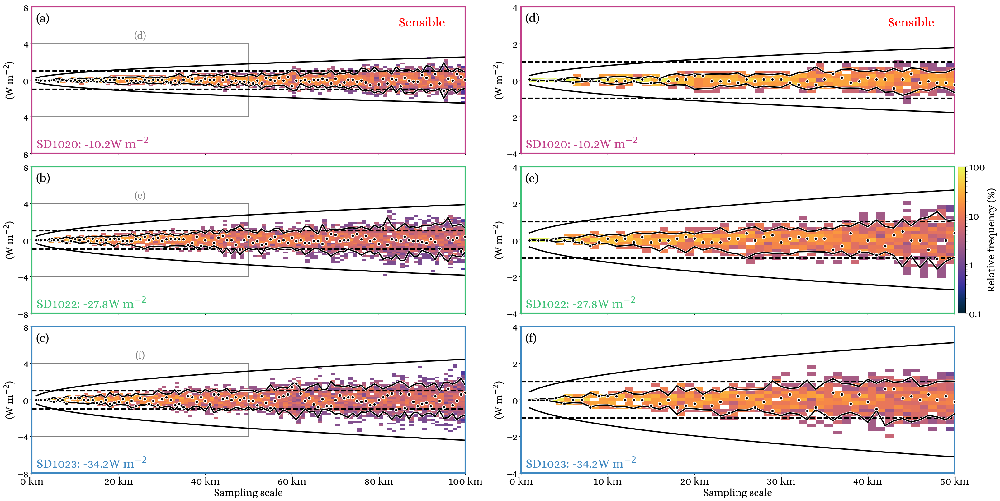

In [190]:
fig,AX = plt.subplots(3,2,figsize=(32,16),constrained_layout=True, sharex="col")

cmap="cmo.thermal"

for ax, lim, ylim, let, title in zip(AX.T,
                              [100,50],
                              [8,4],
                              [["(a)","(b)","(c)"],["(d)","(e)","(f)"]],[["Sensible","",""],["Sensible","",""]]):
    
    for axs, ds, means, stats, x, t, c, l,l2,t1 in zip(ax,
                                                     [dst20, dst22, dst23],
                                                     [sensible_means20, sensible_means22, sensible_means23],
                                                     [sensible_stats20, sensible_stats22, sensible_stats23],
                                                     ['','','Sampling scale'],
                                                     ['SD1020','SD1022','SD1023'],
                                                     [c20,c22,c23],
                                                     let, ["(d)","(e)","(f)"],title
                                                    ):
        ym = means[0]
        
        plot_cone_plots(list_dists, np.asarray(means)-ym, stats, axs,[np.arange(1,lim+1,1),np.arange(-10.1,+10.1,0.2)],cbar)

        for pm in [1,-1]:
            #axs.plot(np.array([0,100]),pm*np.sqrt(np.array([0,100]))+ym,lw=3,c='k')
            axs.plot(np.arange(1,101,1),ds['sensible'].std().values/np.sqrt((len(ds.distance)/stats.dist).astype(int).values)*pm,lw=3,c='k')
            axs.axhline(pm,c='k',lw=3,ls='--')

        axs.set(xlabel=x, ylabel="(W m$^{-2}$)",ylim=(-ylim,+ylim),xlim=(0,lim))
        axs.set_title(t1,loc='center',y=0.85,x=0.9,c='r',fontweight="bold")
        axs.set_title(t + f": {np.round(ym,1)}" + r"W m$^{-2}$",c=c,loc='right',y=0.02,x=0.01,ha='left')
        axs.set_title(l,c='k',loc='left',y=0.88,x=0.01)
    
        fix_spines(axs,c)        
        axs.yaxis.set_major_locator(MaxNLocator(integer=True,nbins=5))
        axs.xaxis.set_major_formatter(FuncFormatter(km_formatter))

        if lim == 100:
            add_box(axs,0,lim/2,ylim/2)
            
cbar=plt.colorbar(img, ax=ax[1], label='Relative frequency (%)', pad=-0.025, aspect=20)
cbar.set_ticks([0.1,1,10,100])
cbar.set_ticklabels(['0.1','1','10','100'])

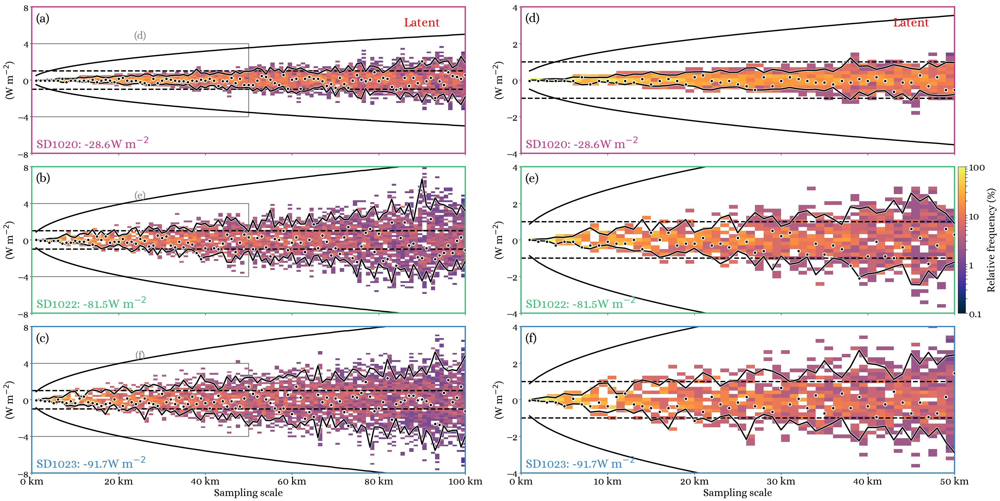

In [191]:
fig,AX = plt.subplots(3,2,figsize=(32,16),constrained_layout=True, sharex="col")

cmap="cmo.thermal"

for ax, lim, ylim, let, title in zip(AX.T,
                              [100,50],
                              [8,4],
                              [["(a)","(b)","(c)"],["(d)","(e)","(f)"]],[["Latent","",""],["Latent","",""]]):
    
    for axs, ds, means, stats, x, t, c, l,l2,t1 in zip(ax,
                                                     [dst20, dst22, dst23],
                                                     [latent_means20, latent_means22, latent_means23],
                                                     [latent_stats20, latent_stats22, latent_stats23],
                                                     ['','','Sampling scale'],
                                                     ['SD1020','SD1022','SD1023'],
                                                     [c20,c22,c23],
                                                     let, ["(d)","(e)","(f)"],title
                                                    ):
        ym = means[0]
        
        plot_cone_plots(list_dists, np.asarray(means)-ym, stats, axs,[np.arange(1,lim+1,1),np.arange(-10.1,+10.1,0.2)],cbar)

        for pm in [1,-1]:
            #axs.plot(np.array([0,100]),pm*np.sqrt(np.array([0,100]))+ym,lw=3,c='k')
            axs.plot(np.arange(1,101,1),ds['latent'].std().values/np.sqrt((len(ds.distance)/stats.dist).astype(int).values)*pm,lw=3,c='k')
            axs.axhline(pm,c='k',lw=3,ls='--')

        axs.set(xlabel=x, ylabel="(W m$^{-2}$)",ylim=(-ylim,+ylim),xlim=(0,lim))
        axs.set_title(t1,loc='center',y=0.85,x=0.9,c='r',fontweight="bold")
        axs.set_title(t + f": {np.round(ym,1)}" + r"W m$^{-2}$",c=c,loc='right',y=0.02,x=0.01,ha='left')
        axs.set_title(l,c='k',loc='left',y=0.88,x=0.01)
    
        fix_spines(axs,c)        
        axs.yaxis.set_major_locator(MaxNLocator(integer=True,nbins=5))
        axs.xaxis.set_major_formatter(FuncFormatter(km_formatter))

        if lim == 100:
            add_box(axs,0,lim/2,ylim/2)
            
cbar=plt.colorbar(img, ax=ax[1], label='Relative frequency (%)', pad=-0.025, aspect=20)
cbar.set_ticks([0.1,1,10,100])
cbar.set_ticklabels(['0.1','1','10','100'])

### Let's subset the data to reflect when the RH is working on SD1020

In [705]:
ds20.sel(time=slice("2018","2019-02-15"))

<xarray.Dataset>
Dimensions:                       (time: 8016)
Coordinates:
  * time                          (time) datetime64[ns] 2019-01-19T04:00:00 ....
Data variables: (12/27)
    latitude                      (time) float64 ...
    longitude                     (time) float64 ...
    SOG                           (time) float64 ...
    COG                           (time) float64 ...
    HDG                           (time) float64 ...
    GUST_WND_MEAN                 (time) float64 ...
    ...                            ...
    qair                          (time) float64 ...
    qsea                          (time) float64 ...
    sensible                      (time) float64 ...
    latent                        (time) float64 ...
    trajectory                    (time) float32 ...
    distance                      (time) float64 0.0 609.5 ... 4.515e+06
Attributes: (12/38)
    title:                     Antarctica Circumnavigation Surface Data
    summary:                   This data set was collected from the first Sai...
    ncei_template_version:     NCEI_NetCDF_Trajectory_Template_v2.0
    Conventions:               CF-1.6, ACDD-1.3
    netcdf_version:            4.6.3
    featureType:               trajectory
    ...                        ...
    geospatial_lat_min:        -60.9862208
    geospatial_lat_max:        -46.4277568
    geospatial_lat_units:      degrees_north
    geospatial_lon_min:        -179.9986816
    geospatial_lon_max:        179.9997312
    geospatial_lon_units:      degrees_east

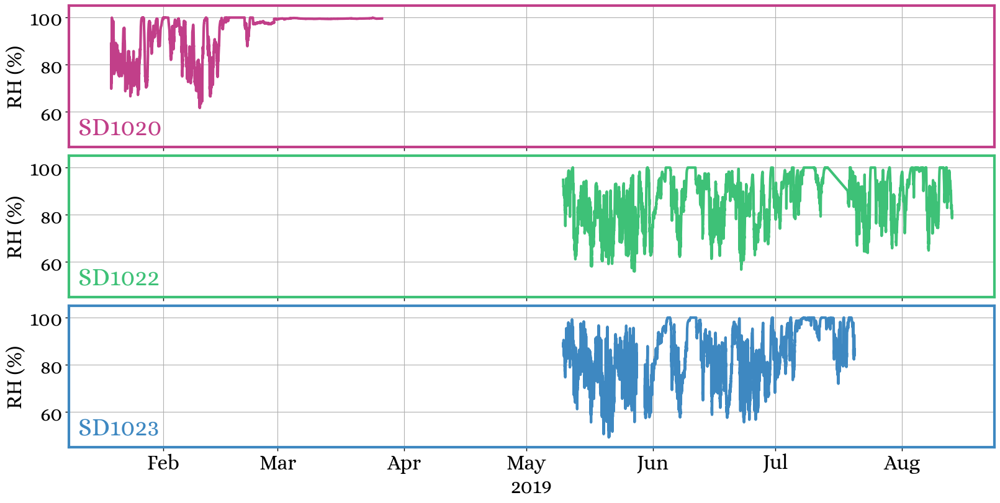

In [733]:
fig,ax = plt.subplots(3,1,figsize=(32/2,16/2),constrained_layout=True,sharex=True)

for axs,ds,c,l in zip(ax,[ds20,ds22,ds23],colors,labels):
    ds["RH_MEAN"].plot(ax=axs,c=c,lw=3)
    axs.set(xlabel="",ylabel="RH (%)", ylim=(45,105))
    fix_spines(axs,c)
    axs.grid()
    axs.set_title(l,loc='left',y=0.05,x=0.01, c=c)
fix_xticks(axs)
my_funcs.rot_ticks(axs,0,'center')

In [240]:
ds20 = xr.open_dataset("../data/sd1020_5min.nc").sel(time=slice("2018","2019-02-15"))
ds22 = xr.open_dataset("../data/sd1022_5min.nc").isel(time=slice(0,len(ds20.distance)))
ds22_2 = xr.open_dataset("../data/sd1022_5min.nc").isel(time=slice(len(ds20.distance),len(ds20.distance)*2))
ds23 = xr.open_dataset("../data/sd1023_5min.nc").isel(time=slice(0,len(ds20.distance)))
ds23_2 = xr.open_dataset("../data/sd1023_5min.nc").isel(time=slice(len(ds20.distance),len(ds20.distance)*2))

In [241]:
ds22_2['distance'] = ds22_2['distance']-ds22_2['distance'][0]
ds23_2['distance'] = ds23_2['distance']-ds23_2['distance'][0]

In [242]:
dst20 = ds20.swap_dims({"time":"distance"}).interp(distance=np.arange(0,ds20['distance'].max().values+1,1000))
dst22 = ds22.swap_dims({"time":"distance"}).interp(distance=np.arange(0,ds22['distance'].max().values+1,1000))
dst22_2 = ds22_2.swap_dims({"time":"distance"}).interp(distance=np.arange(0,ds22['distance'].max().values+1,1000))
dst23 = ds23.swap_dims({"time":"distance"}).interp(distance=np.arange(0,ds23['distance'].max().values+1,1000))
dst23_2 = ds23_2.swap_dims({"time":"distance"}).interp(distance=np.arange(0,ds23['distance'].max().values+1,1000))

In [194]:
def calc_subsets_split(ds, SST):
    """
    Function to calculate subsets and their means from a dataset.

    Parameters:
        - ds (xarray.Dataset): Dataset containing the data.
        - SST (str): Sea surface temperature variable name.

    Returns:
        - ss (list): List of subsets.
        - ssmeans (list): List of means of each subset.
        - dists (list): List of distances for each subset.
    """
    # Initialize lists to store subsets, subset means, and distances
    ss = []         # List to store subsets
    sensible_means = []    # List to store subset means
    latent_means   = []    # List to store subset means
    dists = []      # List to store distances

    # Iterate over distance bins
    for i in tqdm(np.arange(1, 101, 1), desc="Running through each distance bin"):
        # Iterate over each subset within the distance bin
        for j in np.arange(0, i, 1):
            # Calculate subset using calc_tasf function
            subset = calc_tasf(ds.isel(distance=np.arange(0+j, int(ds["distance"].max().values/1000), i)), SST)
            # Append subset, subset mean, and distance to respective lists
            ss.append(subset)
            sensible_means.append(float(subset['sensible'].mean('distance').values))
            latent_means.append(float(subset['latent'].mean('distance').values))
            dists.append(i)

    return ss, sensible_means, latent_means, dists

In [243]:
_, sensible_means20, latent_means20, list_dists = calc_subsets_split(dst20, "TEMP_IR_SEA_WING_UNCOMP_MEAN")
_, sensible_means22, latent_means22, _ = calc_subsets_split(dst22, "TEMP_IR_UNCOR_MEAN")
_, sensible_means23, latent_means23, _ = calc_subsets_split(dst23, "TEMP_IR_UNCOR_MEAN")

Running through each distance bin:   0%|          | 0/100 [00:00<?, ?it/s]

Running through each distance bin:   0%|          | 0/100 [00:00<?, ?it/s]

Running through each distance bin:   0%|          | 0/100 [00:00<?, ?it/s]

Running through each distance bin:   0%|          | 0/100 [00:00<?, ?it/s]

Running through each distance bin:   0%|          | 0/100 [00:00<?, ?it/s]


KeyboardInterrupt



In [196]:
sensible_stats20 = calc_stats(list_dists,sensible_means20)
sensible_stats22 = calc_stats(list_dists,sensible_means22)
sensible_stats23 = calc_stats(list_dists,sensible_means23)

latent_stats20 = calc_stats(list_dists,latent_means20)
latent_stats22 = calc_stats(list_dists,latent_means22)
latent_stats23 = calc_stats(list_dists,latent_means23)

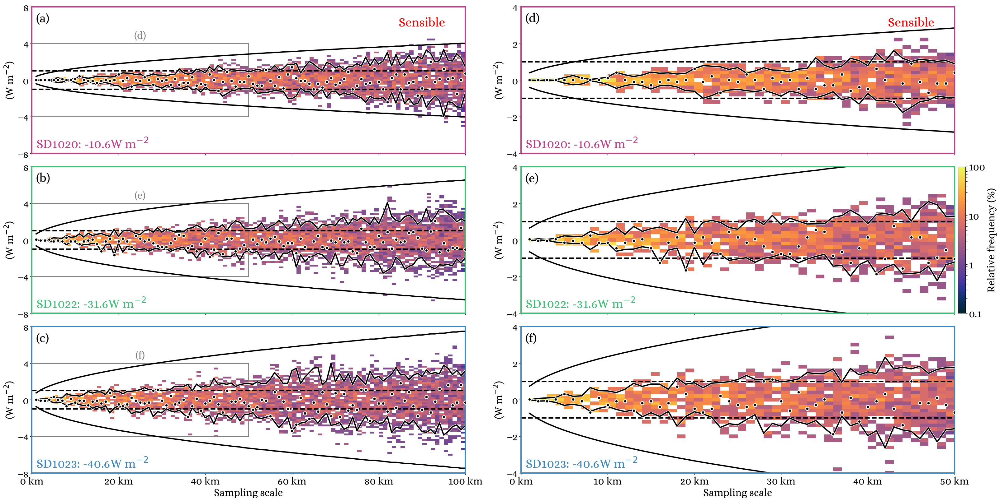

In [202]:
fig,AX = plt.subplots(3,2,figsize=(32,16),constrained_layout=True, sharex="col")

cmap="cmo.thermal"

for ax, lim, ylim, let, title in zip(AX.T,
                              [100,50],
                              [8,4],
                              [["(a)","(b)","(c)"],["(d)","(e)","(f)"]],[["Sensible","",""],["Sensible","",""]]):
    
    for axs, ds, means, stats, x, t, c, l,l2,t1 in zip(ax,
                                                     [dst20, dst22, dst23],
                                                     [sensible_means20, sensible_means22, sensible_means23],
                                                     [sensible_stats20, sensible_stats22, sensible_stats23],
                                                     ['','','Sampling scale'],
                                                     ['SD1020','SD1022','SD1023'],
                                                     [c20,c22,c23],
                                                     let, ["(d)","(e)","(f)"],title
                                                    ):
        ym = means[0]
        
        plot_cone_plots(list_dists, np.asarray(means)-ym, stats, axs,[np.arange(1,lim+1,1),np.arange(-10.1,+10.1,0.2)],cbar)

        for pm in [1,-1]:
            #axs.plot(np.array([0,100]),pm*np.sqrt(np.array([0,100]))+ym,lw=3,c='k')
            axs.plot(np.arange(1,101,1),ds['sensible'].std().values/np.sqrt((len(ds.distance)/stats.dist).astype(int).values)*pm,lw=3,c='k')
            axs.axhline(pm,c='k',lw=3,ls='--')

        axs.set(xlabel=x, ylabel="(W m$^{-2}$)",ylim=(-ylim,+ylim),xlim=(0,lim))
        axs.set_title(t1,loc='center',y=0.85,x=0.9,c='r',fontweight="bold")
        axs.set_title(t + f": {np.round(ym,1)}" + r"W m$^{-2}$",c=c,loc='right',y=0.02,x=0.01,ha='left')
        axs.set_title(l,c='k',loc='left',y=0.88,x=0.01)
    
        fix_spines(axs,c)        
        axs.yaxis.set_major_locator(MaxNLocator(integer=True,nbins=5))
        axs.xaxis.set_major_formatter(FuncFormatter(km_formatter))

        if lim == 100:
            add_box(axs,0,lim/2,ylim/2)


cbar=plt.colorbar(img, ax=ax[1], label='Relative frequency (%)', pad=-0.025, aspect=20)
cbar.set_ticks([0.1,1,10,100])
cbar.set_ticklabels(['0.1','1','10','100'])

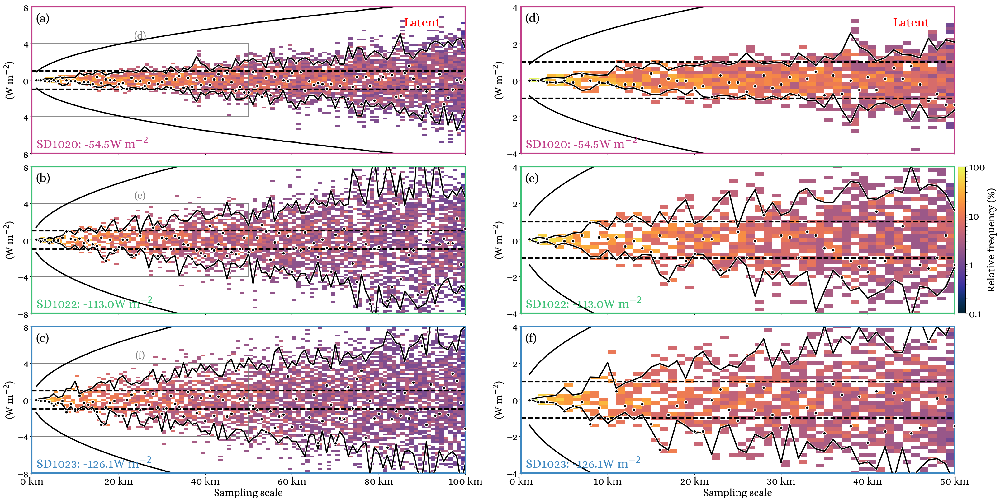

In [201]:
fig,AX = plt.subplots(3,2,figsize=(32,16),constrained_layout=True, sharex="col")

cmap="cmo.thermal"

for ax, lim, ylim, let, title in zip(AX.T,
                              [100,50],
                              [8,4],
                              [["(a)","(b)","(c)"],["(d)","(e)","(f)"]],[["Latent","",""],["Latent","",""]]):
    
    for axs, ds, means, stats, x, t, c, l,l2,t1 in zip(ax,
                                                     [dst20, dst22, dst23],
                                                     [latent_means20, latent_means22, latent_means23],
                                                     [latent_stats20, latent_stats22, latent_stats23],
                                                     ['','','Sampling scale'],
                                                     ['SD1020','SD1022','SD1023'],
                                                     [c20,c22,c23],
                                                     let, ["(d)","(e)","(f)"],title
                                                    ):
        ym = means[0]
        
        plot_cone_plots(list_dists, np.asarray(means)-ym, stats, axs,[np.arange(1,lim+1,1),np.arange(-10.1,+10.1,0.2)],cbar)

        for pm in [1,-1]:
            #axs.plot(np.array([0,100]),pm*np.sqrt(np.array([0,100]))+ym,lw=3,c='k')
            axs.plot(np.arange(1,101,1),ds['latent'].std().values/np.sqrt((len(ds.distance)/stats.dist).astype(int).values)*pm,lw=3,c='k')
            axs.axhline(pm,c='k',lw=3,ls='--')

        axs.set(xlabel=x, ylabel="(W m$^{-2}$)",ylim=(-ylim,+ylim),xlim=(0,lim))
        axs.set_title(t1,loc='center',y=0.85,x=0.9,c='r',fontweight="bold")
        axs.set_title(t + f": {np.round(ym,1)}" + r"W m$^{-2}$",c=c,loc='right',y=0.02,x=0.01,ha='left')
        axs.set_title(l,c='k',loc='left',y=0.88,x=0.01)
    
        fix_spines(axs,c)        
        axs.yaxis.set_major_locator(MaxNLocator(integer=True,nbins=5))
        axs.xaxis.set_major_formatter(FuncFormatter(km_formatter))

        if lim == 100:
            add_box(axs,0,lim/2,ylim/2)
            
cbar=plt.colorbar(img, ax=ax[1], label='Relative frequency (%)', pad=-0.025, aspect=20)
cbar.set_ticks([0.1,1,10,100])
cbar.set_ticklabels(['0.1','1','10','100'])

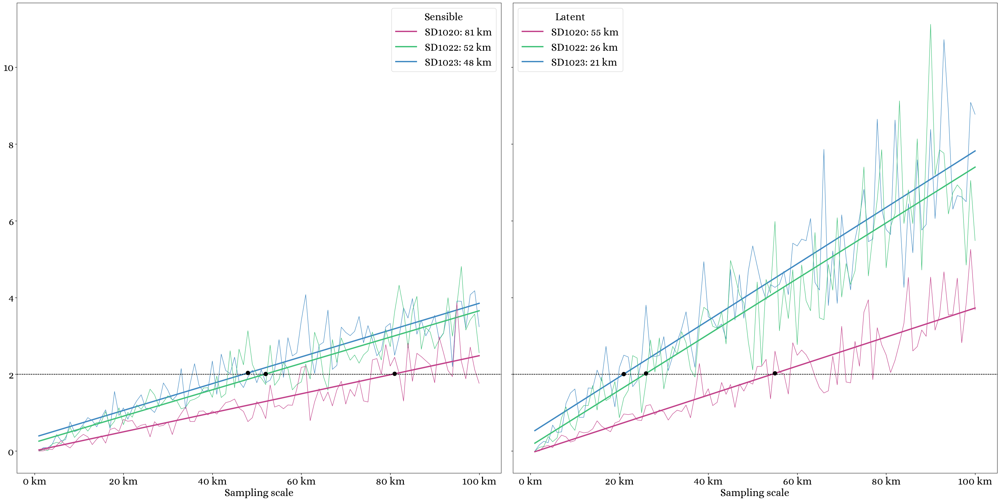

In [187]:
fig, ax = plt.subplots(1,2,figsize=(32,16),constrained_layout=True,sharey=True)

for axs,dss,t in zip(ax,[[sensible_stats20,sensible_stats22,sensible_stats23],[latent_stats20,latent_stats22,latent_stats23]],['Sensible',"Latent"]):

    for stats,c,z,l in zip(dss,colors,[3,2,1],labels):
        
        reg = sstats.linregress(stats['dist'], stats['delta'])
        idx = int(np.where((reg.slope * stats['dist'] + reg.intercept).values > 2)[0][0])

        stats["delta"].plot(c=c,lw=1,zorder=z,ax=axs)
        axs.plot(stats['dist'],(reg.slope * stats['dist'] + reg.intercept).values,zorder=z,c=c,lw=3, label=l + f": {stats['dist'][idx].values} km")
        axs.scatter(stats['dist'][idx],(reg.slope * stats['dist'] + reg.intercept).values[idx],zorder=z+1,fc="k",ec="None",s=100)

        axs.axhline(2,lw=1,ls='--',c='0',zorder=3)
        
        axs.set(xlabel="Sampling scale",ylabel=r"$\Delta$ 95$^{th}$ - 5$^{th}$ percentile (W m$^{-2}$)" if z==3 else "")
        

    axs.legend(title=t)
    axs.xaxis.set_major_formatter(FuncFormatter(km_formatter))


plt.show()


In [244]:
ss20, ssmeans20, dists20, stds20 = calc_subsets(dst20, "TEMP_IR_SEA_WING_UNCOMP_MEAN")
ss22, ssmeans22, dists22, stds22 = calc_subsets(dst22, "TEMP_CTD_RBR_MEAN")
ss23, ssmeans23, dists23, stds23 = calc_subsets(dst23, "TEMP_CTD_RBR_MEAN")

Running through each distance bin:   0%|          | 0/100 [00:00<?, ?it/s]

Running through each distance bin:   0%|          | 0/100 [00:00<?, ?it/s]

Running through each distance bin:   0%|          | 0/100 [00:00<?, ?it/s]

Running through each distance bin:   0%|          | 0/100 [00:00<?, ?it/s]

Running through each distance bin:   0%|          | 0/100 [00:00<?, ?it/s]

In [252]:
stats20 = calc_stats(dists20,ssmeans20,stds20)
stats22 = calc_stats(dists22,ssmeans22,stds22)
stats23 = calc_stats(dists23,ssmeans23,stds23)

In [253]:
reg20 = sstats.linregress(stats20['dist'], stats20['delta'])
reg22 = sstats.linregress(stats22['dist'], stats22['delta'])
reg23 = sstats.linregress(stats23['dist'], stats23['delta'])

regs = [reg20,reg22,reg23]

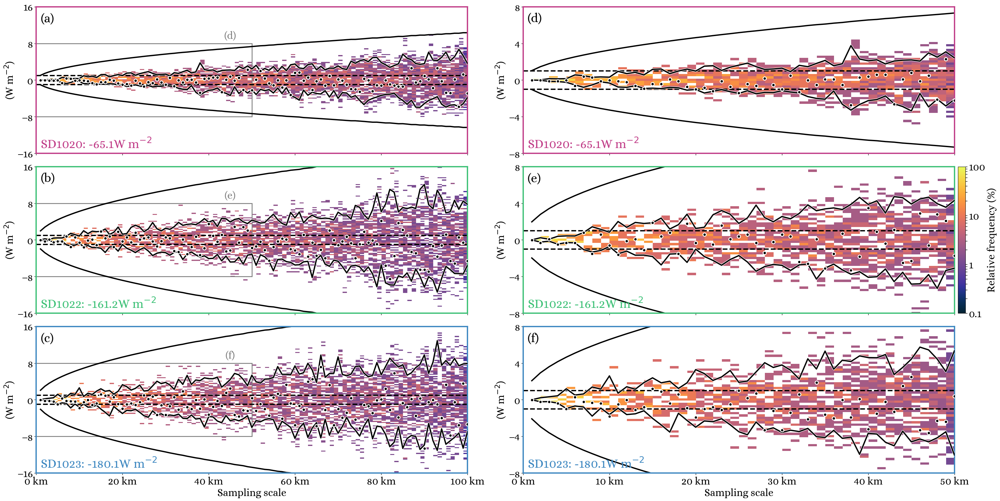

In [254]:
fig,AX = plt.subplots(3,2,figsize=(32,16),constrained_layout=True, sharex="col")

cmap="cmo.thermal"

for ax, lim, ylim, let in zip(AX.T,
                              [100,50],
                              [16,8],
                              [["(a)","(b)","(c)"],["(d)","(e)","(f)"]]):
    
    for axs, dists, ds, means, stats, x, t, c, l,l2 in zip(ax,
                                                     [dists20, dists22, dists23],
                                                     [dst20, dst22, dst23],
                                                     [ssmeans20, ssmeans22, ssmeans23],
                                                     [stats20, stats22, stats23],
                                                     ['','','Sampling scale'],
                                                     ['SD1020','SD1022','SD1023'],
                                                     [c20,c22,c23],
                                                     let, ["(d)","(e)","(f)"]
                                                    ):
        ym = means[0]
       
        img = plot_cone_plots(dists, np.array(means)-ym, stats, axs,[np.arange(1,lim+1,1),np.arange(-20.1,20.1,0.25)],cbar=False)
        #(stats.isel(dist=slice(1,lim+1))['p95']).plot(ax=ax,c='w',lw=5,zorder=4)

        for pm in [1,-1]:
            #axs.plot(np.array([0,100]),pm*np.sqrt(np.array([0,100])),lw=3,c='k')
            axs.plot(np.arange(1,101,1),stats['std'].values/np.sqrt((len(ds.distance)/stats.dist).astype(int).values)*pm,lw=3,c='k')
            axs.axhline(pm,c='k',lw=3,ls='--')

        axs.set(xlabel=x, ylabel="(W m$^{-2}$)",ylim=(-ylim,+ylim),xlim=(0,lim))
        axs.set_title(t + f": {np.round(ym,1)}" + r"W m$^{-2}$",c=c,loc='right',y=0.02,x=0.01,ha='left')
        axs.set_title(l,c='k',loc='left',y=0.88,x=0.01)
    
        fix_spines(axs,c)

        axs.yaxis.set_major_locator(MaxNLocator(integer=True,nbins=5))
        axs.xaxis.set_major_formatter(FuncFormatter(km_formatter))

        if lim == 100:
            add_box(axs,0,lim/2,ylim/2)


cbar=plt.colorbar(img, ax=ax[1], label='Relative frequency (%)', pad=-0.025, aspect=20)
cbar.set_ticks([0.1,1,10,100])
cbar.set_ticklabels(['0.1','1','10','100'])

In [258]:
dst20

<xarray.Dataset>
Dimensions:                       (distance: 4515)
Coordinates:
  * distance                      (distance) float64 0.0 1e+03 ... 4.514e+06
Data variables: (12/26)
    latitude                      (distance) float64 -46.68 -46.69 ... -54.21
    longitude                     (distance) float64 168.5 168.5 ... -131.9
    SOG                           (distance) float64 1.778 1.958 ... 2.331 2.335
    COG                           (distance) float64 119.0 107.2 ... 122.1 119.9
    HDG                           (distance) float64 113.8 104.1 ... 125.3 125.6
    GUST_WND_MEAN                 (distance) float64 17.0 16.91 ... 12.49 12.98
    ...                            ...
    qref                          (distance) float64 9.884 9.536 ... 5.661 5.666
    qair                          (distance) float64 9.972 9.662 ... 5.665 5.675
    qsea                          (distance) float64 10.83 10.89 ... 5.704 5.761
    sensible                      (distance) float64 6.655 13.82 ... -7.222
    latent                        (distance) float64 -54.95 -76.78 ... -4.115
    trajectory                    (distance) float64 1.02e+03 ... 1.02e+03
Attributes: (12/38)
    title:                     Antarctica Circumnavigation Surface Data
    summary:                   This data set was collected from the first Sai...
    ncei_template_version:     NCEI_NetCDF_Trajectory_Template_v2.0
    Conventions:               CF-1.6, ACDD-1.3
    netcdf_version:            4.6.3
    featureType:               trajectory
    ...                        ...
    geospatial_lat_min:        -60.9862208
    geospatial_lat_max:        -46.4277568
    geospatial_lat_units:      degrees_north
    geospatial_lon_min:        -179.9986816
    geospatial_lon_max:        179.9997312
    geospatial_lon_units:      degrees_east

In [259]:
dst20['tasf'] = dst20['sensible'] + dst20['latent']
dst22['tasf'] = dst22['sensible'] + dst22['latent']
dst23['tasf'] = dst23['sensible'] + dst23['latent']

In [271]:
dregs = sstats.linregress([reg20.slope,reg22.slope,reg23.slope],
           [dst20['tasf'].std().values,dst22['tasf'].std().values,dst23['tasf'].std().values])

regs = [reg20, reg22, reg23]

In [274]:
dregs

LinregressResult(slope=954.3928391834421, intercept=-13.034685917562214, rvalue=0.9920541427097015, pvalue=0.08030701641086323, stderr=121.03549385594168, intercept_stderr=17.71982955250043)

In [275]:
regs[0]

LinregressResult(slope=0.09798719666654794, intercept=0.13418960442757122, rvalue=0.9335217236637504, pvalue=1.8917683377475786e-45, stderr=0.003801423626618772, intercept_stderr=0.22112067937312796)

In [276]:
ds['tasf'].std().values

array(128.32500981)

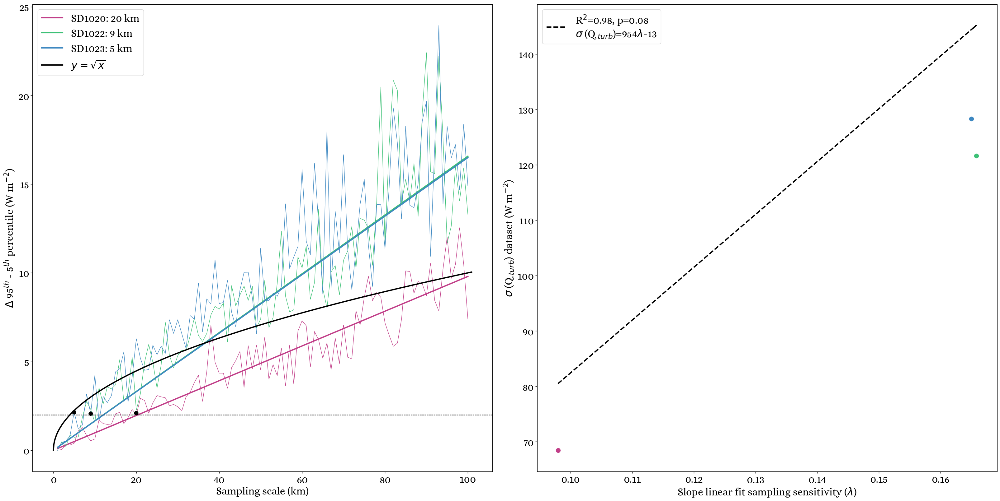

In [273]:
fig,(ax,bx) = plt.subplots(1,2,figsize=(32,16),constrained_layout=True)

for ds,stats,c,reg,l,z in zip(datasets,[stats20, stats22, stats23], colors, regs, labels, [3,2,1]):
    
    idx = int(np.where((reg.slope * stats['dist'] + reg.intercept).values > 2)[0][0])

    stats['delta'].plot(ax=ax,c=c,lw=1)

    ax.plot(stats['dist'], reg.slope * stats['dist'] + reg.intercept, c=c, lw=3, label=l + f": {stats['dist'][idx].values} km")
    ax.axhline(2,lw=1,ls='--',c='0',zorder=3)

    ax.set(ylabel = r"$\Delta$ 95$^{th}$ - 5$^{th}$ percentile (W m$^{-2}$)",
           xlabel = 'Sampling scale (km)')
    
    bx.scatter(reg.slope, ds['tasf'].std().values,c=c,s=100)
    ax.scatter(stats['dist'][idx],(reg.slope * stats['dist'] + reg.intercept).values[idx],zorder=z+1,fc="k",ec="None",s=100)

ax.plot(np.arange(0,101,0.1),np.sqrt(np.arange(0,101,0.1)),lw=3,ls='-',c='k',label=r"$y=\sqrt{x}$")

ax.legend(loc='upper left',ncols=1)

bx.plot([reg20.slope,reg22.slope,reg23.slope],
         np.asarray(dregs.slope*np.array([reg20.slope,reg22.slope,reg23.slope])) + dregs.intercept,
         lw=3, c='k',ls='--',label=f"R$^2$={(dregs.rvalue**2).round(2)}, p={dregs.pvalue.round(2)}\n" + 
         r"$\sigma$ (Q $_{turb}$)=" + f"{int(dregs.slope)}" + r"$\lambda$"+f"{int(dregs.intercept)}")


bx.legend()
bx.set(xlabel=r"Slope linear fit sampling sensitivity ($\lambda$)",
       ylabel=r"$\sigma$ (Q $_{turb}$) dataset (W m$^{-2}$)")

plt.show()

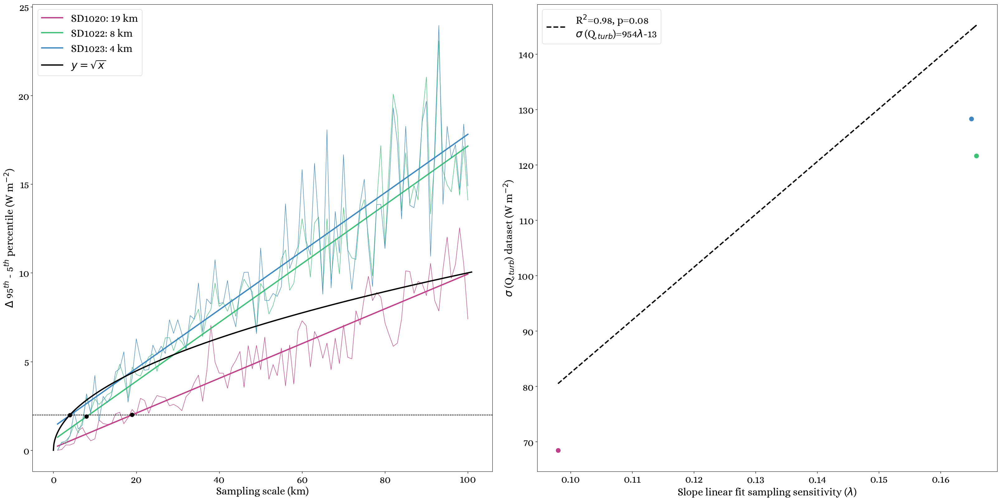

In [287]:
fig,(ax,bx) = plt.subplots(1,2,figsize=(32,16),constrained_layout=True)

for ds,stats,c,reg,l,z in zip(datasets,[stats20, (stats22+stats23)/2, stats23], colors, regs, labels, [3,2,1]):
    
    idx = int(np.where((reg.slope * stats['dist'] + reg.intercept).values > 2)[0][0])-1

    stats['delta'].plot(ax=ax,c=c,lw=1)

    ax.plot(stats['dist'], reg.slope * stats['dist'] + reg.intercept, c=c, lw=3, label=l + f": {stats['dist'][idx].values} km")
    ax.axhline(2,lw=1,ls='--',c='0',zorder=3)

    ax.set(ylabel = r"$\Delta$ 95$^{th}$ - 5$^{th}$ percentile (W m$^{-2}$)",
           xlabel = 'Sampling scale (km)')
    
    bx.scatter(reg.slope, ds['tasf'].std().values,c=c,s=100)
    ax.scatter(stats['dist'][idx],(reg.slope * stats['dist'] + reg.intercept).values[idx],zorder=z+1,fc="k",ec="None",s=100)

ax.plot(np.arange(0,101,0.1),np.sqrt(np.arange(0,101,0.1)),lw=3,ls='-',c='k',label=r"$y=\sqrt{x}$")

ax.legend(loc='upper left',ncols=1)

bx.plot([reg20.slope,reg22.slope,reg23.slope],
         np.asarray(dregs.slope*np.array([reg20.slope,reg22.slope,reg23.slope])) + dregs.intercept,
         lw=3, c='k',ls='--',label=f"R$^2$={(dregs.rvalue**2).round(2)}, p={dregs.pvalue.round(2)}\n" + 
         r"$\sigma$ (Q $_{turb}$)=" + f"{int(dregs.slope)}" + r"$\lambda$"+f"{int(dregs.intercept)}")


bx.legend()
bx.set(xlabel=r"Slope linear fit sampling sensitivity ($\lambda$)",
       ylabel=r"$\sigma$ (Q $_{turb}$) dataset (W m$^{-2}$)")

plt.show()

In [286]:
regs

[LinregressResult(slope=0.09798719666654794, intercept=0.13418960442757122, rvalue=0.9335217236637504, pvalue=1.8917683377475786e-45, stderr=0.003801423626618772, intercept_stderr=0.22112067937312796),
 LinregressResult(slope=0.16575933676643922, intercept=0.5719492918581963, rvalue=0.9144490211580113, pvalue=2.769387528541895e-40, stderr=0.007410369400921562, intercept_stderr=0.4310453338753718),
 LinregressResult(slope=0.16499371009996483, intercept=1.3142427734601707, rvalue=0.9150705134574338, pvalue=1.9671845964233866e-40, stderr=0.007345501017809561, intercept_stderr=0.42727207881294654)]

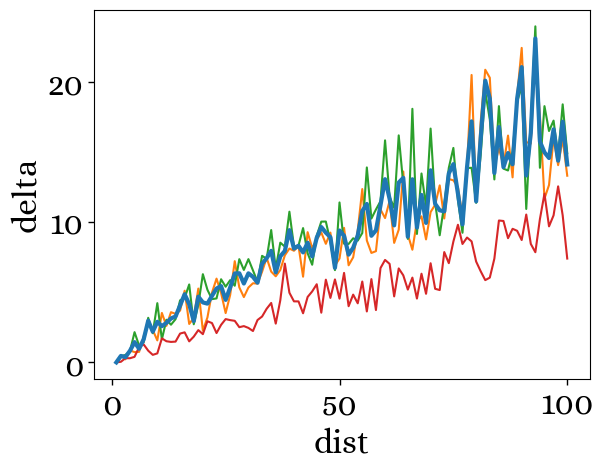

In [285]:
((stats22+stats23)/2)["delta"].plot(zorder=3,lw=3)
stats22["delta"].plot()
stats23["delta"].plot()


In [2]:
data = xr.open_dataset('/Users/xedhjo/Documents/Projects/saildrone/sd-1067/daily_files/1min/saildrone-gen_6-so-chic_2022-sd1067-20220824T000000-20220824T235959-1_minutes-v1.1661387443783.nc').load().squeeze().swap_dims({'obs':'time'})

/Users/xedhjo/opt/miniconda3/envs/env/lib/python3.11/site-packages/xarray/coding/variables.py:214: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  condition |= data == fv


In [3]:
data

<xarray.Dataset>
Dimensions:                                   (time: 1440)
Coordinates:
    latitude                                  (time) float64 -41.63 ... -41.09
    longitude                                 (time) float64 10.42 ... 10.02
  * time                                      (time) datetime64[ns] 2022-08-2...
    trajectory                                float32 1.067e+03
Data variables: (12/104)
    SOG                                       (time) float64 0.808 ... 1.211
    SOG_FILTERED_MEAN                         (time) float64 0.856 0.844 ... nan
    SOG_FILTERED_STDDEV                       (time) float64 0.33 0.388 ... nan
    SOG_FILTERED_MAX                          (time) float64 1.56 1.755 ... nan
    SOG_FILTERED_MIN                          (time) float64 0.105 0.258 ... nan
    COG                                       (time) float64 299.5 297.2 ... 7.2
    ...                                        ...
    O2_CONC_SBE37_MEAN                        (time) float64 267.4 nan ... nan
    O2_CONC_SBE37_STDDEV                      (time) float64 0.21 nan ... nan
    O2_SAT_SBE37_MEAN                         (time) float64 96.34 nan ... nan
    O2_SAT_SBE37_STDDEV                       (time) float64 0.08 nan ... nan
    CHLOR_WETLABS_MEAN                        (time) float64 nan nan ... nan nan
    CHLOR_WETLABS_STDDEV                      (time) float64 nan nan ... nan nan
Attributes: (12/38)
    title:                     SO-CHIC 2022 NRT Surface Data
    summary:                   Southern Ocean CO2 study centered at 60*S, 0*E...
    ncei_template_version:     NCEI_NetCDF_Trajectory_Template_v2.0
    Conventions:               CF-1.6, ACDD-1.3
    netcdf_version:            4.6.2
    featureType:               trajectory
    ...                        ...
    geospatial_lat_min:        -41.6297664
    geospatial_lat_max:        -41.0866912
    geospatial_lat_units:      degrees_north
    geospatial_lon_min:        10.006752
    geospatial_lon_max:        10.418968
    geospatial_lon_units:      degrees_east